# Experiment 2

## Loading Samples

In [1]:
import os
import bokeh
from bokeh.plotting import show
import pandas as pd
import numpy as np

import flowkit as fk
import seaborn as sns
import matplotlib.pyplot as plt

bokeh.io.output_notebook()

Loading BokehJS ...

In [2]:
workspace = fk.Workspace('Metadata/Study 15-2011-V1.504090.wsp', fcs_samples='FCS/CyTOF/Raw', ignore_missing_files = True)

In [3]:
samples = workspace.get_sample_ids()
samples

['082812-Mike-Study 15-2011-15065_cells_found.txt',
 '082812-Mike-Study 15-2011-15075_cells_found.txt',
 '082812-Mike-Study 15-2011-15076_cells_found.txt',
 '082812-Mike-Study 15-2011-15079_cells_found.txt',
 '082812-Mike-Study 15-2011-15090_cells_found.txt',
 '082812-Mike-Study 15-2011-15096_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15094_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15095_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15103_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15107_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15108_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15109_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15110_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15111_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15112_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15113_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15114_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15115_cells_found.txt',
 '083012-Mike-Study 15-2011-

In [4]:
workspace.analyze_samples()

In [5]:
workspace.get_transforms(samples[0])

{'Time': LinearTransform(t: 2097.7114257812, a: 0.0),
 'Cell_length': LinearTransform(t: 128.0, a: 0.0),
 '(In115)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Nd142)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Nd143)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Nd144)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Nd146)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Sm147)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Sm149)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Nd150)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Eu151)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Sm152)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Sm154)Dd': WSPBiexTransform(width: -20.0, neg: 0.0, pos: 5.0, top: 19949.0),
 '(Gd156)Dd': W

In [6]:
workspace.get_gating_strategy(samples[0]).get_gate_ids()

[('Intact cells', ('root',)),
 ('Intact singlets', ('root', 'Intact cells')),
 ('Live intact singlets', ('root', 'Intact cells', 'Intact singlets')),
 ('CD3+', ('root', 'Intact cells', 'Intact singlets', 'Live intact singlets')),
 ('CCR7+ CD45RA+',
  ('root', 'Intact cells', 'Intact singlets', 'Live intact singlets', 'CD3+')),
 ('HLADR- CD38+',
  ('root',
   'Intact cells',
   'Intact singlets',
   'Live intact singlets',
   'CD3+',
   'CCR7+ CD45RA+')),
 ('HLADR- CD38-',
  ('root',
   'Intact cells',
   'Intact singlets',
   'Live intact singlets',
   'CD3+',
   'CCR7+ CD45RA+'))]

In [7]:
def extractCYTOF(s, transforms = [], partition = "base", kde = False):
    sample = workspace.get_sample(s)
    if "XForm" in transforms:
        t = fk.transforms.WSPBiexTransform(negative=0, width=-20, positive=5, max_value=199490)
        sample.apply_transform(t)
        sample = sample.as_dataframe()
    else:
        sample = sample.as_dataframe(source = "raw")
    sample.drop(['Time','Cell_length','(In115)Dd','(Nd142)Dd','(Nd146)Dd','(Sm147)Dd','(Sm149)Dd','(Sm154)Dd','(Gd156)Dd',
                         '(Dy164)Dd','(Ho165)Dd','(Er166)Dd','(Er168)Dd','(Er170)Dd','(Yb171)Dd','(Yb174)Dd','(Yb176)Dd',
                        '(Ir191)Dd','(Ir193)Dd'], level = 0, axis = 1, inplace = True)
    sample.columns = sample.columns.droplevel()
    sample['Preprocessed'] = workspace.get_gate_membership(s, 'Live intact singlets')
    sample['HLADR-CD38+'] = workspace.get_gate_membership(s, 'HLADR- CD38+')
    sample['HLADR-CD38-'] = workspace.get_gate_membership(s, 'HLADR- CD38-')
    sample['CD3+CCR7+CD45RA+HLADR-'] = sample['HLADR-CD38+'] | sample['HLADR-CD38-']
    sample = sample[sample['Preprocessed'] == True]
    sample = sample.reset_index(drop = True).drop(columns = ['HLADR-CD38+','HLADR-CD38-','Preprocessed'])
    X = sample.iloc[:,:-1]
    Y = sample.iloc[:,-1].to_numpy().astype(int)
    if partition == "known":
        X = X.iloc[:,[2, 5, 6, 8]]
    if "Log" in transforms:
        shift_value = np.abs(np.min(X)) + 1
        X = np.log10(X + shift_value)
    if "Rank" in transforms:
        X = X.rank(axis = 1) / len(X) * 100
    if kde == True:
        sns.kdeplot(X)
        plt.show()
    X = X.to_numpy()
    return X, Y

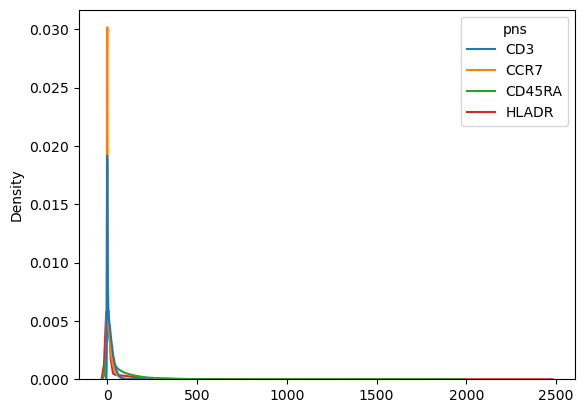

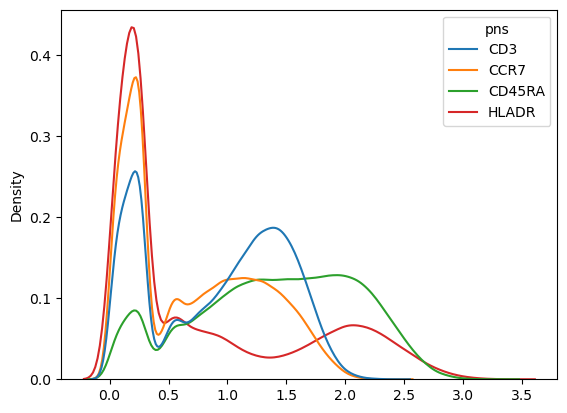

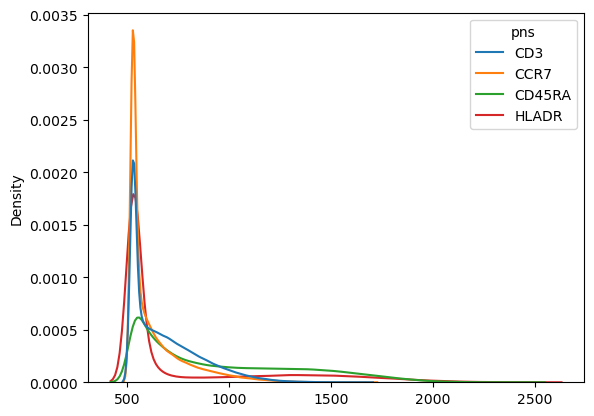

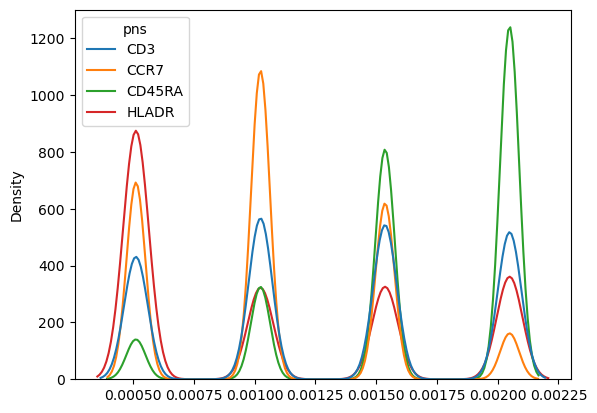

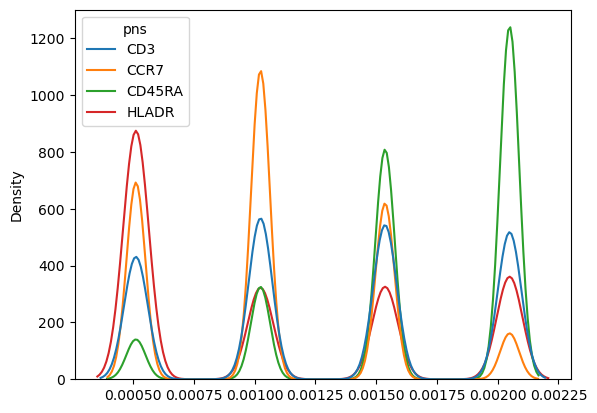

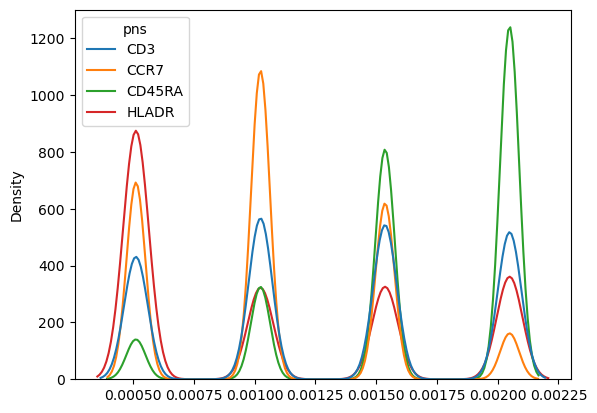

In [8]:
# Distributions of makres in the data
a, b = extractCYTOF(samples[0], partition = "known", kde = True)
a, b = extractCYTOF(samples[0], ['Log'], partition = "known", kde = True)
a, b = extractCYTOF(samples[0], ['XForm'], partition = "known", kde = True)
a, b = extractCYTOF(samples[0], ['Rank'], partition = "known", kde = True)
a, b = extractCYTOF(samples[0], ['Log', 'Rank'], partition = "known", kde = True)
a, b = extractCYTOF(samples[0], ['XForm','Rank'], partition = "known", kde = True)

## The Network

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import math

Modules from Lee et. al

In [10]:
# Multihead Attention Block
class MAB(nn.Module):
    def __init__(self, dim_Q, dim_K, dim_V, num_heads, ln=False):
        super(MAB, self).__init__()
        self.dim_V = dim_V
        self.num_heads = num_heads
        self.fc_q = nn.Linear(dim_Q, dim_V)
        self.fc_k = nn.Linear(dim_K, dim_V)
        self.fc_v = nn.Linear(dim_K, dim_V)
        if ln:
            self.ln0 = nn.LayerNorm(dim_V)
            self.ln1 = nn.LayerNorm(dim_V)
        self.fc_o = nn.Linear(dim_V, dim_V)

    def forward(self, Q, K):
        Q = self.fc_q(Q)
        K, V = self.fc_k(K), self.fc_v(K)
        dim_split = self.dim_V // self.num_heads
        Q_ = torch.cat(Q.split(dim_split, 2), 0)
        K_ = torch.cat(K.split(dim_split, 2), 0)
        V_ = torch.cat(V.split(dim_split, 2), 0)

        A = torch.softmax(Q_.bmm(K_.transpose(1,2))/math.sqrt(self.dim_V), 2)
        O = torch.cat((Q_ + A.bmm(V_)).split(Q.size(0), 0), 2)
        O = O if getattr(self, 'ln0', None) is None else self.ln0(O)
        O = O + F.relu(self.fc_o(O))
        O = O if getattr(self, 'ln1', None) is None else self.ln1(O)
        return O

In [11]:
# Self Attention Block
class SAB(nn.Module):
    def __init__(self, dim_in, dim_out, num_heads, ln=False):
        super(SAB, self).__init__()
        self.mab = MAB(dim_in, dim_in, dim_out, num_heads, ln=ln)

    def forward(self, X):
        return self.mab(X, X)

In [12]:
# Induced Self Attention BLock
class ISAB(nn.Module):
    def __init__(self, dim_in, dim_out, num_heads, num_inds, ln=False):
        super(ISAB, self).__init__()
        self.I = nn.Parameter(torch.Tensor(1, num_inds, dim_out))
        nn.init.xavier_uniform_(self.I)
        self.mab0 = MAB(dim_out, dim_in, dim_out, num_heads, ln=ln)
        self.mab1 = MAB(dim_in, dim_out, dim_out, num_heads, ln=ln)

    def forward(self, X):
        H = self.mab0(self.I.repeat(X.size(0), 1, 1), X)
        return self.mab1(X, H)

In [13]:
# Pooling by Multihead Attention
class PMA(nn.Module):
    def __init__(self, dim, num_heads, num_seeds, ln=False):
        super(PMA, self).__init__()
        self.S = nn.Parameter(torch.Tensor(1, num_seeds, dim))
        nn.init.xavier_uniform_(self.S)
        self.mab = MAB(dim, dim, dim, num_heads, ln=ln)

    def forward(self, X):
        return self.mab(self.S.repeat(X.size(0), 1, 1), X)

Network Design

In [14]:
class CellPredictor(nn.Module):
    """
    Modified Set Transformer for predicting H1, H3, and B values from flow cytometry data
    
    Args:
        num_markers: Number of markers in the FCS file
        dim_hidden: Dimension of hidden representation
        num_heads: Number of attention heads
        num_inds: Number of induced points for ISAB
        hidden_layers: Number of hidden layers
        layer_norm: Whether to use layer normalization
    """
    def __init__(self, 
                 num_markers, 
                 dim_hidden=32, 
                 num_heads=4, 
                 num_inds=16,
                 hidden_layers=2,
                 layer_norm=True,
                 dropout=0.1):
        super(CellPredictor, self).__init__()
        
        # Store configuration
        self.num_markers = num_markers
        
        # Encoder - processes each cell as part of a set
        enc_layers = [ISAB(num_markers, dim_hidden, num_heads, num_inds, ln=layer_norm)]
        for _ in range(1, hidden_layers):
            enc_layers.append(ISAB(dim_hidden, dim_hidden, num_heads, num_inds, ln=layer_norm))
        self.enc = nn.Sequential(*enc_layers)
        
        dec_layers = [nn.Linear(dim_hidden, 1)]
        self.dec = nn.Sequential(*dec_layers)
        
    def forward(self, x):
        """
        Args:
            x: Input tensor of shape [batch_size, num_cells, num_markers]
                where each sample contains a variable number of cells
                
        Returns:
            Tensor of shape [batch_size, 3] with predicted H1, H3, B values
        """
        # Apply set transformer to process all cells
        h = self.enc(x)  # [batch_size, num_cells, dim_hidden]
        return self.dec(h)[:,:,0]

23

['082812-Mike-Study 15-2011-15065_cells_found.txt',
 '082812-Mike-Study 15-2011-15075_cells_found.txt',
 '082812-Mike-Study 15-2011-15076_cells_found.txt',
 '082812-Mike-Study 15-2011-15079_cells_found.txt',
 '082812-Mike-Study 15-2011-15090_cells_found.txt',
 '082812-Mike-Study 15-2011-15096_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15094_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15095_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15103_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15107_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15108_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15109_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15110_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15111_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15112_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15113_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15114_cells_found.txt',
 '083012-Mike-Study 15-2011-V1-15115_cells_found.txt',
 '083012-Mike-Study 15-2011-

['090512-Study 15-2011-15120_cells_found.txt',
 '090512-Study 15-2011-15122_cells_found.txt',
 '090712-Mike-Study 15-2011-15010_cells_found.txt',
 '090712-Mike-Study 15-2011-15020_cells_found.txt',
 '090712-Mike-Study 15-2011-15021_cells_found.txt',
 '090712-Mike-Study 15-2011-15022_cells_found.txt']

Epoch 1/100: Train Loss = 0.6344, Val Loss = 0.5420
Epoch 2/100: Train Loss = 0.5693, Val Loss = 0.5014
Epoch 3/100: Train Loss = 0.5483, Val Loss = 0.4803
Epoch 4/100: Train Loss = 0.5303, Val Loss = 0.4579
Epoch 5/100: Train Loss = 0.5142, Val Loss = 0.4377
Epoch 6/100: Train Loss = 0.4831, Val Loss = 0.4040
Epoch 7/100: Train Loss = 0.4475, Val Loss = 0.3693
Epoch 8/100: Train Loss = 0.4050, Val Loss = 0.3146
Epoch 9/100: Train Loss = 0.3639, Val Loss = 0.2778
Epoch 10/100: Train Loss = 0.3221, Val Loss = 0.2352
Epoch 11/100: Train Loss = 0.2884, Val Loss = 0.2023
Epoch 12/100: Train Loss = 0.2712, Val Loss = 0.1881
Epoch 13/100: Train Loss = 0.2495, Val Loss = 0.1939
Epoch 14/100: Train Loss = 0.2355, Val Loss = 0.1684
Epoch 15/100: Train Loss = 0.2291, Val Loss = 0.1635
Epoch 16/100: Train Loss = 0.2253, Val Loss = 0.1550
Epoch 17/100: Train Loss = 0.2198, Val Loss = 0.1575
Epoch 18/100: Train Loss = 0.2127, Val Loss = 0.1473
Epoch 19/100: Train Loss = 0.2125, Val Loss = 0.1657
Ep

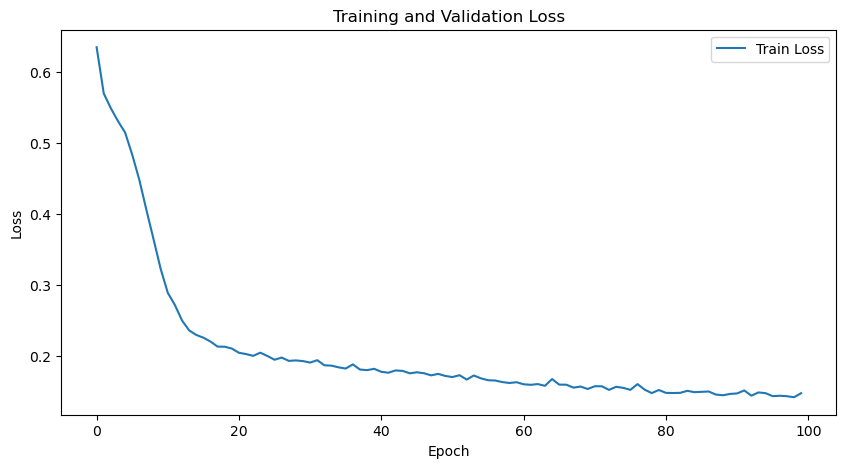

In [15]:
import torch.optim as optim
import matplotlib.pyplot as plt

all_samples = samples

# initialize the model
model = CellPredictor(num_markers=4)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)
optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.01)
criterion = nn.BCEWithLogitsLoss()
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

history = {
    'train_loss': [],
    'val_loss': [],
    'val_r2': []
}

train_range = int(len(all_samples)*0.8)
train_cells = all_samples[:train_range]
val_cells = all_samples[train_range:]
display(train_range)
display(train_cells)
display(val_cells)

num_epochs = 100

# start training
for epoch in range(num_epochs):
    # train phase
    model.train()
    train_loss = 0.0
    train_order = np.random.permutation(len(train_cells))
    for i in train_order:
        optimizer.zero_grad()
        all_cells, true_cells = extractCYTOF(train_cells[i], ['Log'], partition = "known")
        #cell_picks = np.random.choice(all_cells.shape[0], 50000, replace=False)
        cells = torch.tensor(all_cells, dtype=torch.float32).to(device)
        cells = cells.unsqueeze(0).expand(8, -1, -1) # for batch size of 8
        titers = torch.tensor(true_cells, dtype=torch.float32).to(device)
        titers = titers.unsqueeze(0).expand(8, -1) # for batch size of 8
        # forward pass
        predictions = model(cells)
        loss = criterion(predictions, titers)
        
        # backward pass
        loss.backward()
        optimizer.step()
        del cells
        train_loss += float(loss)
    train_loss /= len(train_cells)
    history['train_loss'].append(train_loss)
  # validation phase
    model.eval()
    val_loss = 0.0
    all_preds = []
    all_targets = []
    with torch.no_grad():
        for i in range(len(val_cells)):
            all_cells, true_cells = extractCYTOF(val_cells[i], ['Log'], partition = "known")
            #cell_picks = np.random.choice(all_cells.shape[0], 50000, replace=False)
            cells = torch.tensor(all_cells, dtype=torch.float32).to(device)
            cells = cells.unsqueeze(0).expand(8, -1, -1) # for batch size of 8
            titers = torch.tensor(true_cells, dtype=torch.float32).to(device)
            titers = titers.unsqueeze(0).expand(8, -1) # for batch size of 8
            predictions = model(cells)
            loss = criterion(predictions, titers)
            val_loss += float(loss)
            del cells
        all_preds.append(predictions.cpu().numpy())
        all_targets.append(titers.cpu().numpy())
      
    val_loss /= len(val_cells)
    history['val_loss'].append(val_loss)
      
    all_preds = np.vstack(all_preds)
    all_targets = np.vstack(all_targets)
  
    scheduler.step(val_loss)
    print(f"Epoch {epoch+1}/{num_epochs}: Train Loss = {train_loss:.4f}, Val Loss = {val_loss:.4f}") 

# Save model
torch.save(model.state_dict(), "cell_model.pth")

# plot loss
plt.figure(figsize=(10, 5))
plt.plot(history['train_loss'], label='Train Loss')
#plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.savefig('training_history.png')
plt.show()

Sample:  0


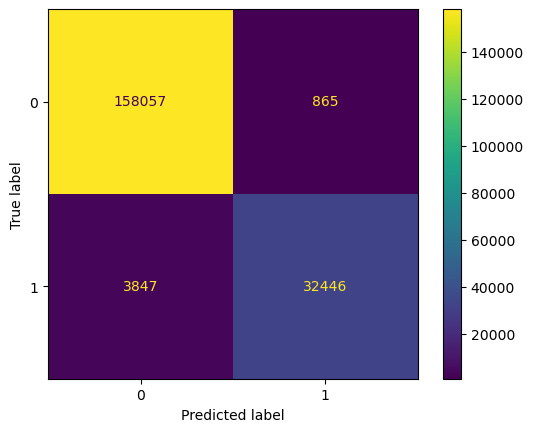

Train Error for sample:  0.024137489434725816
_____________________________________
Sample:  1


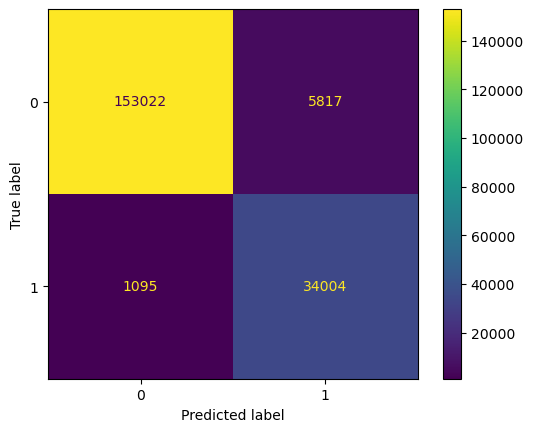

Train Error for sample:  0.03564025616434118
_____________________________________
Sample:  2


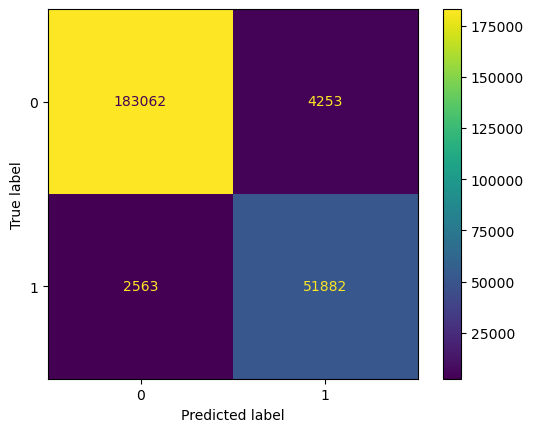

Train Error for sample:  0.028193249503639974
_____________________________________
Sample:  3


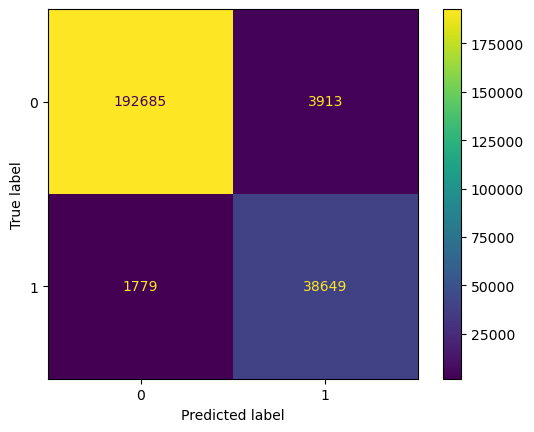

Train Error for sample:  0.024014243163197287
_____________________________________
Sample:  4


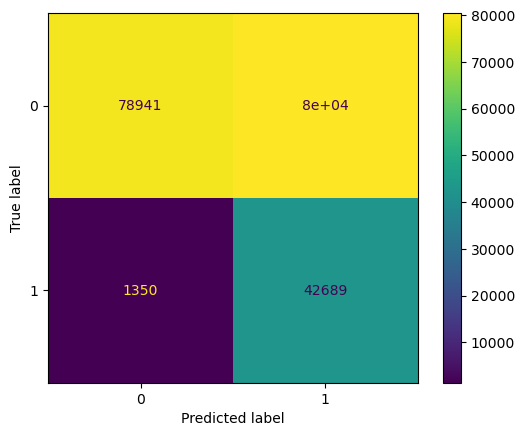

Train Error for sample:  0.40211567387948915
_____________________________________
Sample:  5


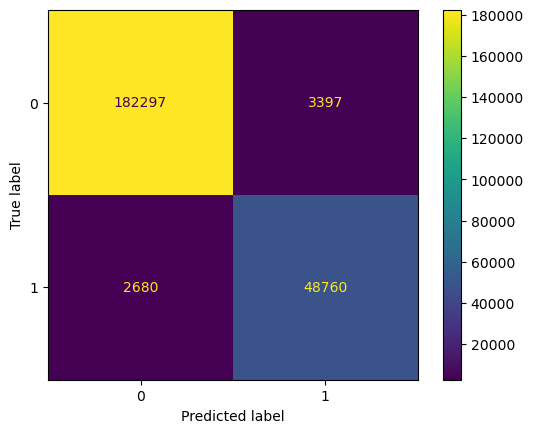

Train Error for sample:  0.025626860762269433
_____________________________________
Sample:  6


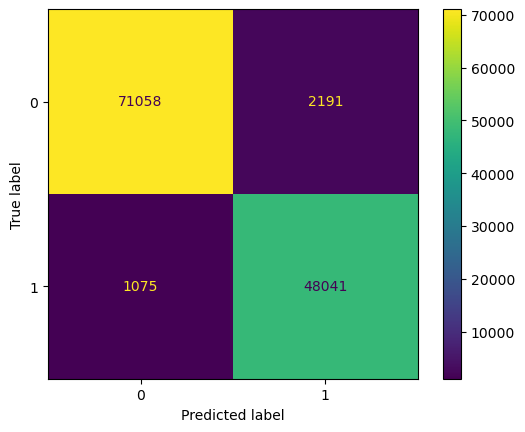

Train Error for sample:  0.026690638663016384
_____________________________________
Sample:  7


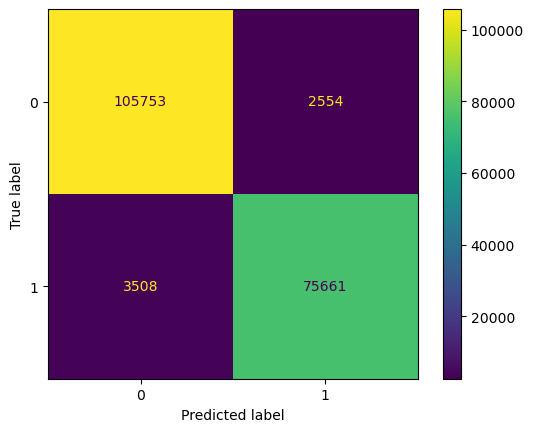

Train Error for sample:  0.03233480552177345
_____________________________________
Sample:  8


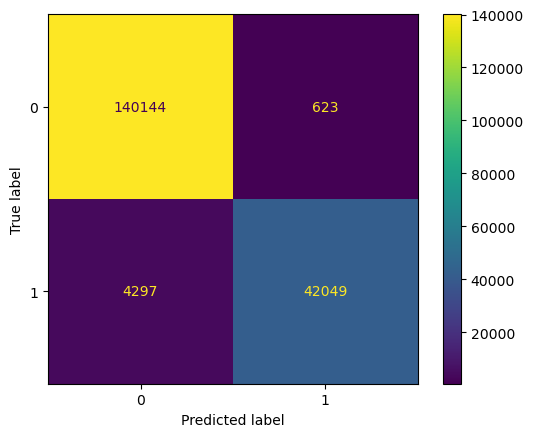

Train Error for sample:  0.026294271376120313
_____________________________________
Sample:  9


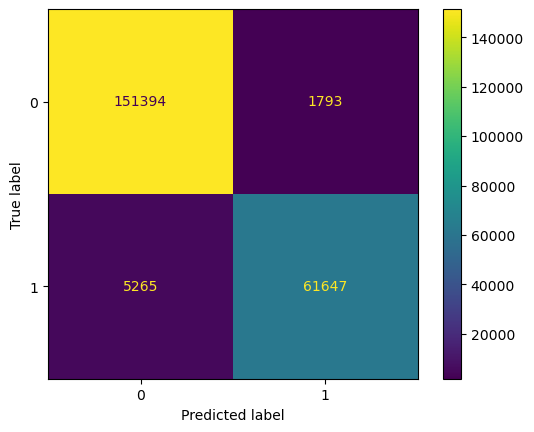

Train Error for sample:  0.03206738785728241
_____________________________________
Sample:  10


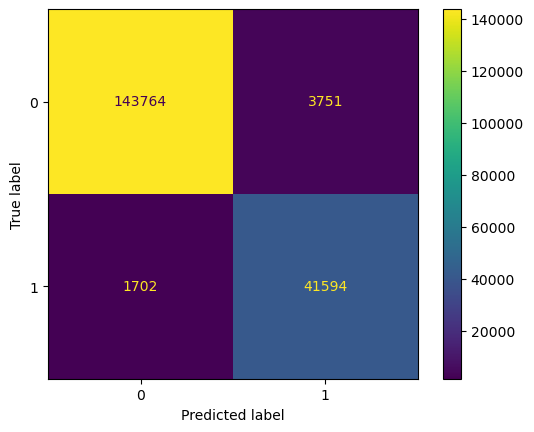

Train Error for sample:  0.02857801699063471
_____________________________________
Sample:  11


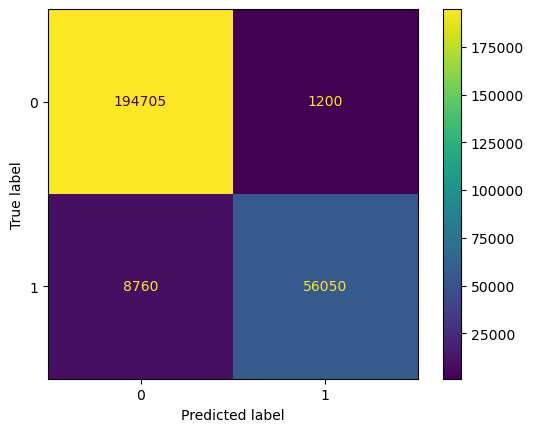

Train Error for sample:  0.038202635061273804
_____________________________________
Sample:  12


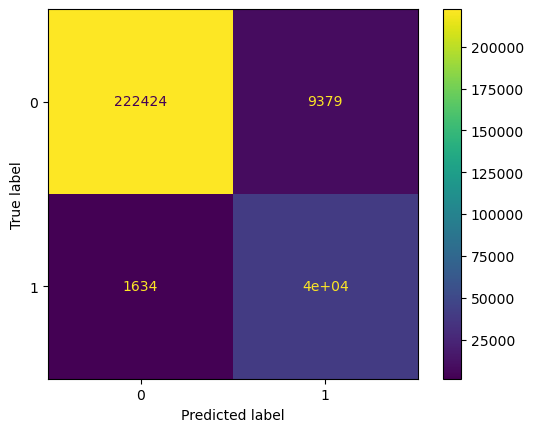

Train Error for sample:  0.04024939788538077
_____________________________________
Sample:  13


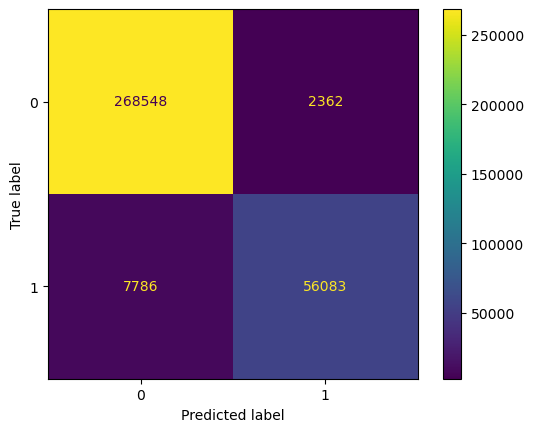

Train Error for sample:  0.03031253453770995
_____________________________________
Sample:  14


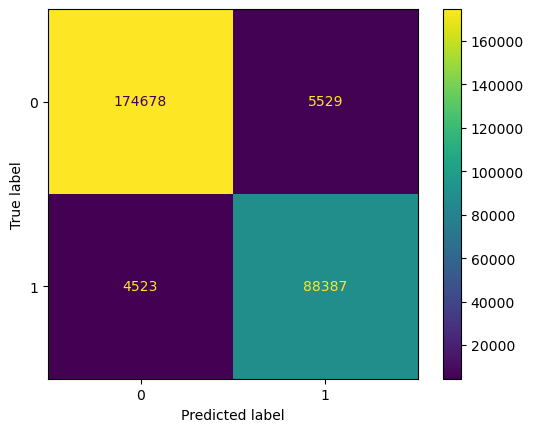

Train Error for sample:  0.03680473936078677
_____________________________________
Sample:  15


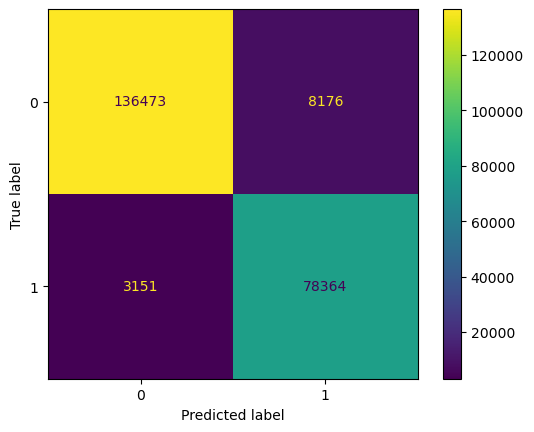

Train Error for sample:  0.0500831255195345
_____________________________________
Sample:  16


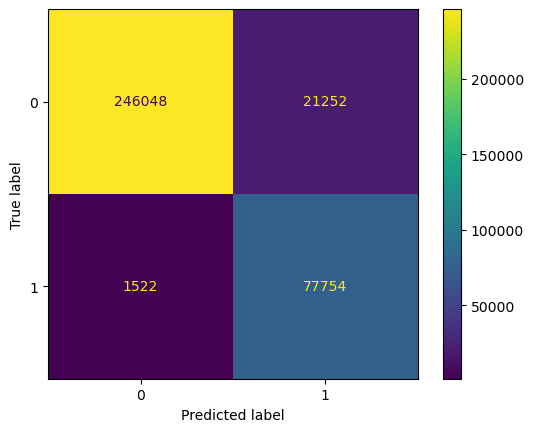

Train Error for sample:  0.06571141683209455
_____________________________________
Sample:  17


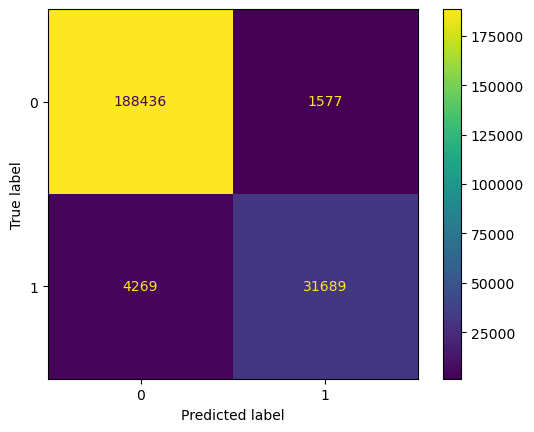

Train Error for sample:  0.025870576312889706
_____________________________________
Sample:  18


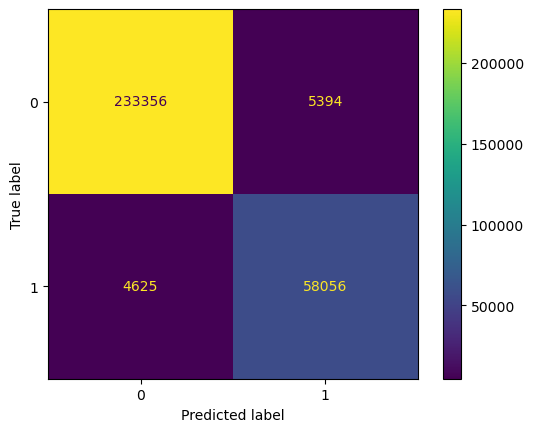

Train Error for sample:  0.033238120830306105
_____________________________________
Sample:  19


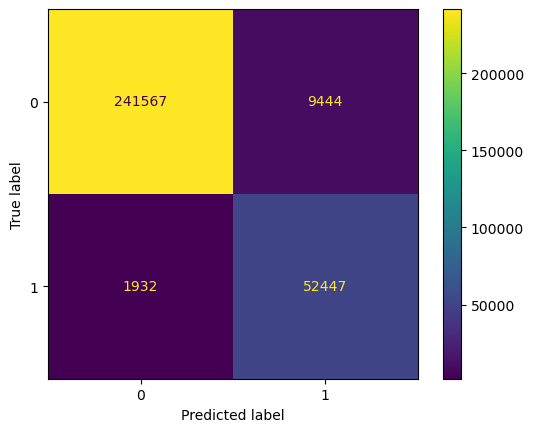

Train Error for sample:  0.037250728576574216
_____________________________________
Sample:  20


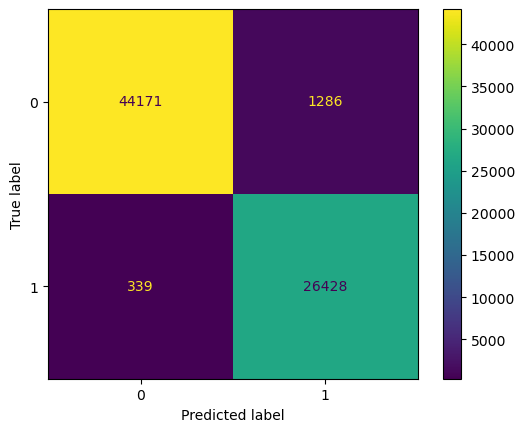

Train Error for sample:  0.022499446167478954
_____________________________________
Sample:  21


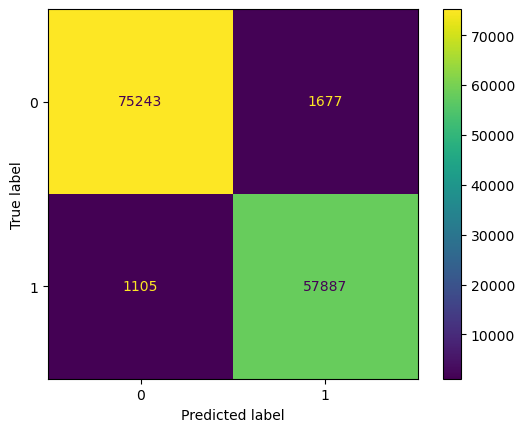

Train Error for sample:  0.020469127082229678
_____________________________________
Sample:  22


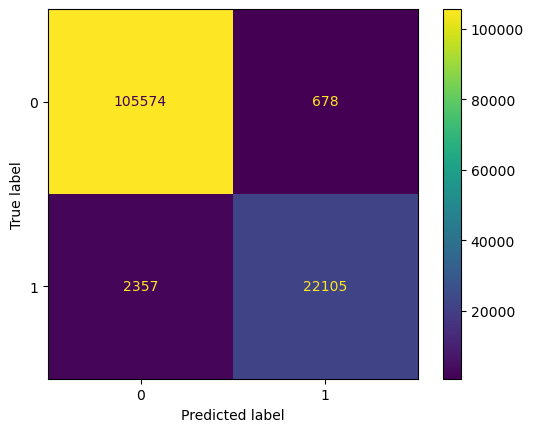

Train Error for sample:  0.02321862998607647
_____________________________________
Sample:  23


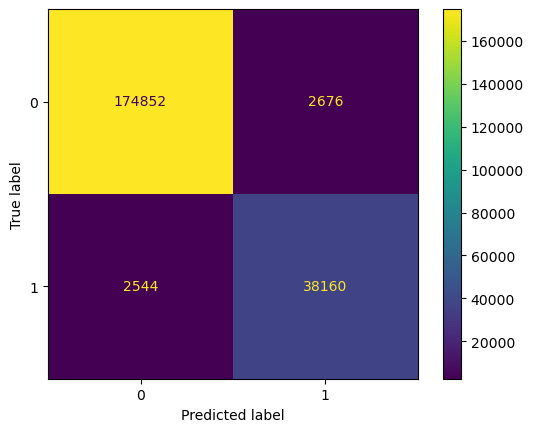

Train Error for sample:  0.02391949851534147
_____________________________________
Sample:  24


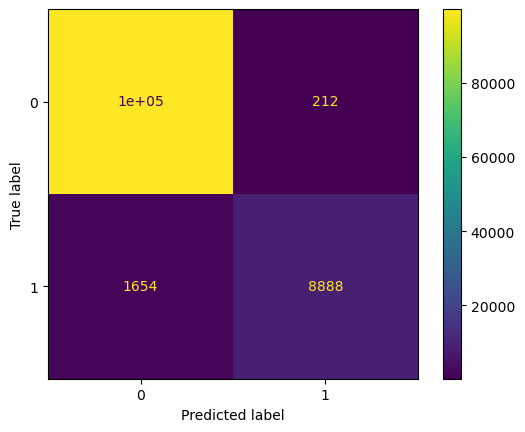

Train Error for sample:  0.016870389121944163
_____________________________________
Sample:  25


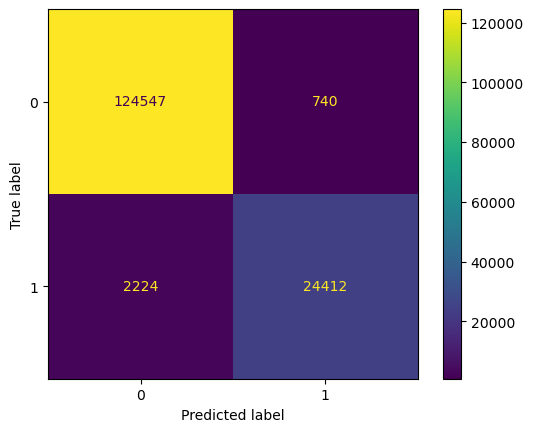

Train Error for sample:  0.019509883296143442
_____________________________________
Sample:  26


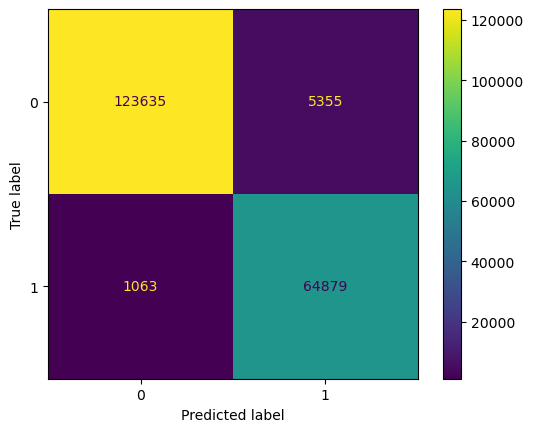

Train Error for sample:  0.032924301807809905
_____________________________________
Sample:  27


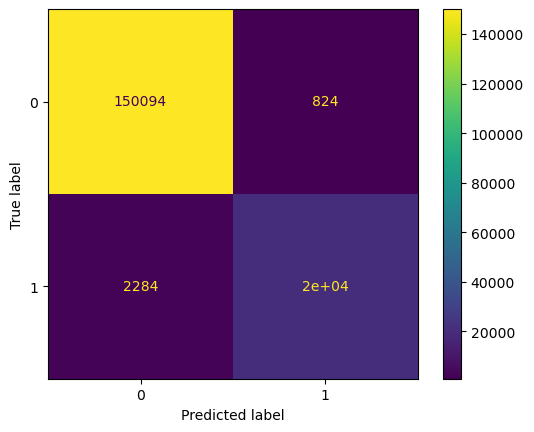

Train Error for sample:  0.01789941083985556
_____________________________________
Sample:  28


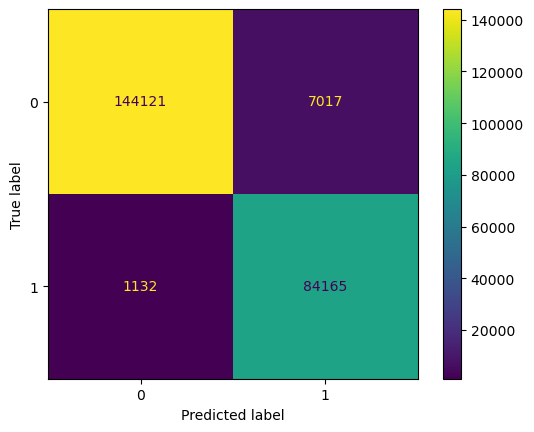

Train Error for sample:  0.034466132340812486
_____________________________________
Train Error for dataset:  0.04328251680657697


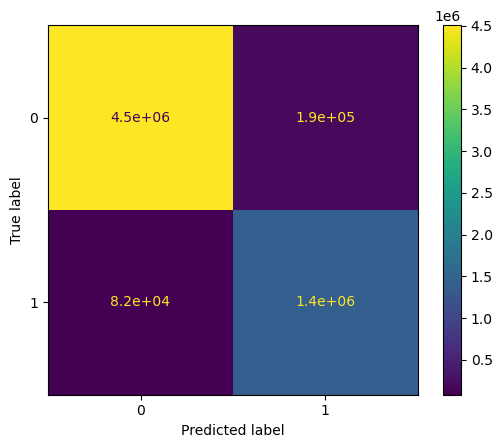

In [16]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
error = 0
cfall = np.zeros((2,2))
for i in range(len(samples)):
    print("Sample: ", i)
    first_subject_data, Y_true = extractCYTOF(samples[i], ['Log'], partition = "known")
    cells = torch.tensor(first_subject_data, dtype=torch.float32).to(device)
    cells = cells.unsqueeze(0)
    
    # Get predictions
    model.eval()
    with torch.no_grad():
      predictions = model(cells)

    mean_predictions = nn.functional.sigmoid(predictions.mean(dim=0)).cpu().numpy()
    preds = []
    mask = []
    for m in mean_predictions:
        if m > 0.5:
            preds.append(1)
            mask.append(True)
        else:
            preds.append(0)
            mask.append(False)
    cf=confusion_matrix(preds, Y_true)
    cfd = ConfusionMatrixDisplay(cf)
    cfall += cf
    cfd.plot()
    plt.show()
    err = (preds != Y_true)
    err = err.sum() / len(err)
    error += err
    print("Train Error for sample: ", err)
    print("_____________________________________")

error = error / len(samples)
print("Train Error for dataset: ", error)
cfdall = ConfusionMatrixDisplay(cfall)
cfdall.plot()
plt.show()

In [17]:
flow = pd.read_csv("flow_data.csv")
flowfiles = flow['FCS Preprocessed']
flowfiles

0     export_Panel_L1_A1_L1_110194_PBMC_10112011_A01...
1     export_Panel_L1_A2_L1_110197_PBMC_10112011_A02...
2     export_Panel_L1_A3_L1_110243_PBMC_10172011_A03...
3     export_Panel_L1_A1_L1_110244_PBMC_10172011_A01...
4     export_Panel_L1_E3_L1_110247_PBMC_10172011_E03...
5     export_Panel_L1_E1_L1_110248_PBMC_10172011_E01...
6     export_Panel_L1_A2_L1_110250_PBMC_10172011_A02...
7     export_Panel_L1_E2_L1_110255_PBMC_10172011_E02...
8     export_Panel_L1_A3_L1_110256_PBMC_10172011_A03...
9     export_Panel_L1_A1_L1_110257_PBMC_10172011_A01...
10    export_Panel_L1_E1_L1_110258_PBMC_10172011_E01...
11    export_Panel_L1_E3_L1_110259_PBMC_10172011_E03...
12    export_Panel_L1_A2_L1_110260_PBMC_10172011_A02...
13    export_Panel_L1_A3_L1_110265_PBMC_10172011_A03...
14    export_Panel_L1_A1_L1_110267_PBMC_10172011_A01...
15    export_Panel_L1_E1_L1_110268_PBMC_10172011_E01...
16    export_Panel_L1_E3_L1_110269_PBMC_10172011_E03...
17    export_Panel_L1_E3_L1_110270_PBMC_10172011

In [18]:
def extractFlow(sampleName, transforms = [], partition = "base", kde = False):
    path = os.path.join("FCS/Flow/Preprocessed", sampleName)
    S = fk.Sample(path)
    if "XForm" in transforms:
        t = fk.transforms.WSPBiexTransform(negative=0, width=-100, positive=4.48, max_value=300000)
        S.apply_transform(t)
        sample = S.as_dataframe()
    else:
        sample = S.as_dataframe(source = "raw")
    sample.drop(['FSC-A','FSC-H','FSC-W','SSC-A','SSC-H','SSC-W','Time'], level = 0, axis = 1, inplace = True)
    sample.drop('Viability', level = 1, axis = 1, inplace = True)
    sample.columns = sample.columns.droplevel()
    sample = sample.iloc[:,[6,1,7,0,3,4,5,2,8]]
    if partition == "known":
        sample = sample.iloc[:,[2, 5, 6, 8]]
    if "Log" in transforms:
        shift_value = np.abs(np.min(sample)) + 1
        sample = np.log10(sample + shift_value)
    if "Rank" in transforms:
        sample = sample.rank(axis = 1) / len(sample) * 100
    if kde == True:
        sns.kdeplot(sample)
        plt.show()
    sample = sample.to_numpy()
    return S, sample

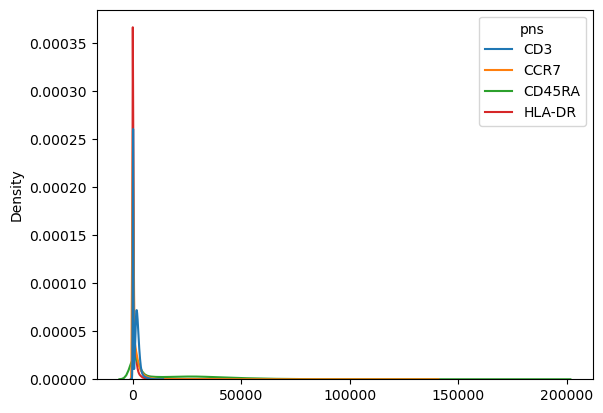

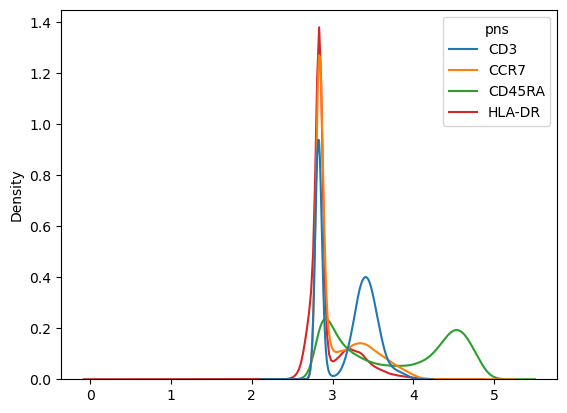

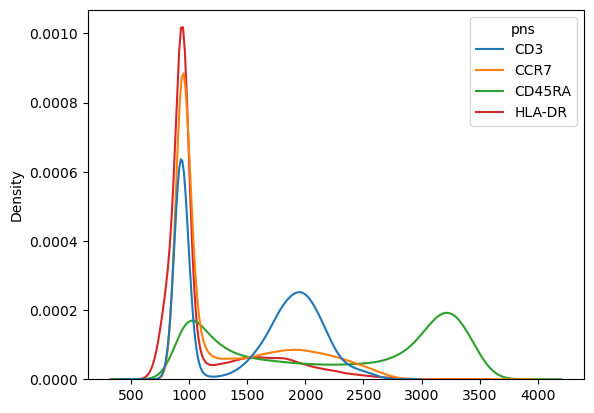

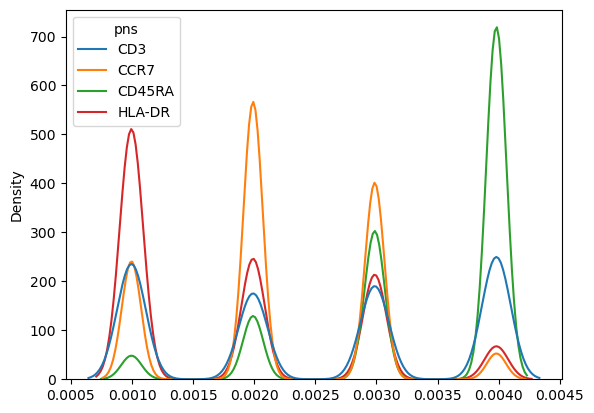

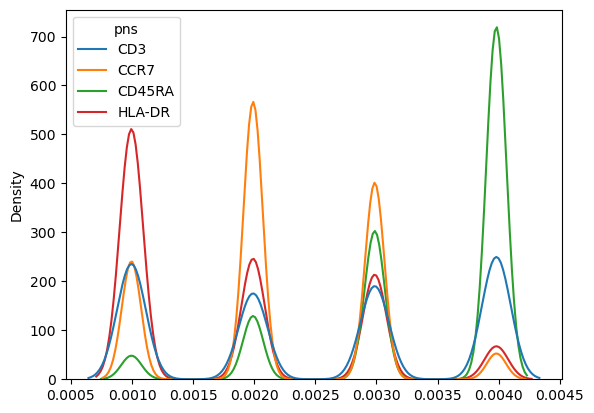

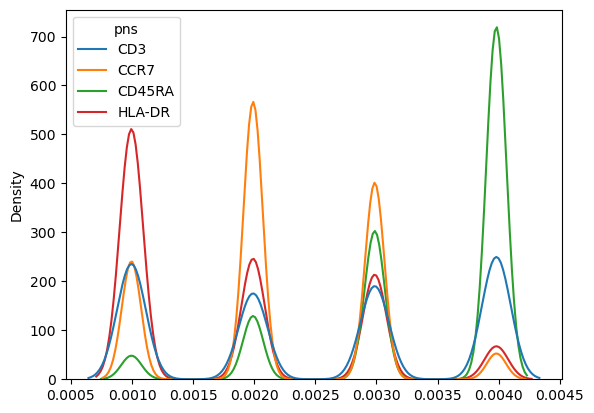

In [19]:
samp, subject_data = extractFlow(flowfiles[0], partition = "known", kde = True)
samp, subject_data = extractFlow(flowfiles[0], ['Log'], partition = "known", kde = True)
samp, subject_data = extractFlow(flowfiles[0], ['XForm'],partition = "known", kde = True)
samp, subject_data = extractFlow(flowfiles[0], ['Rank'],partition = "known", kde = True)
samp, subject_data = extractFlow(flowfiles[0], ['Log', 'Rank'],partition = "known", kde = True)
samp, subject_data = extractFlow(flowfiles[0], ['XForm', 'Rank'],partition = "known", kde = True)

In [20]:
for i in range(len(flowfiles)):
    print("Sample: ", i)
    samp, subject_data = extractFlow(flowfiles[i], ['Log'], partition = "known") ### CHANGE HERE
    cells = torch.tensor(subject_data, dtype=torch.float32).to(device)
    cells = cells.unsqueeze(0)
    
    # Get predictions
    model.eval()
    with torch.no_grad():
      predictions = model(cells)

    mean_predictions = nn.functional.sigmoid(predictions.mean(dim=0)).cpu().numpy()
    mask = []
    for m in mean_predictions:
        if m > 0.5:
            mask.append(True)
        else:
            mask.append(False)
    t = fk.transforms.WSPBiexTransform(negative=0, width=-100, positive=4.48, max_value=300000)
    samp.apply_transform(t) ## COMMENT THIS OUT IF YOU ARE RUNNING XFORM PLEASE PLEASE PLEASE
    show(samp.plot_scatter(samp.pnn_labels[11],samp.pnn_labels[12], highlight_mask = np.array(mask)))
    show(samp.plot_scatter(samp.pnn_labels[14],samp.pnn_labels[15], highlight_mask = np.array(mask)))

Sample:  0


Sample:  1


Sample:  2


Sample:  3


Sample:  4


Sample:  5


Sample:  6


Sample:  7


Sample:  8


Sample:  9


Sample:  10


Sample:  11


Sample:  12


Sample:  13


Sample:  14


Sample:  15


Sample:  16


Sample:  17


Sample:  18


Sample:  19
